# analysis V0 - new basis code - Dec 4, 2023
- cleaned up the data QC and organizations a bit


TODO: 
- flip an axis (y-axis) when plotting - not in data
- having two anndata and their spin offs - both FISH and proj data 
- separate and organize plotting functions 
- organize the plots and generate more insights
- focus on L2/3 cells

In [1]:
import numpy as np
import pandas as pd
import os 
import matplotlib.pyplot as plt
import umap
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib

import anndata 

from scroutines import config_plots
from scroutines import basicu
from scroutines import miscu

In [2]:
import sys
sys.setrecursionlimit(10000)
from scipy.cluster import hierarchy as sch

In [3]:
pth_dat = '/u/home/f/f7xiesnm/project-zipursky/easifish/lt172/proc/v1/'
!ls $pth_dat

bad_roi_list.npy  roi_all.csv  roi.csv	spotcount.csv


In [4]:
gene_names = {
    'r1_c0': 'Sorcs3',
    'r1_c1': 'Kcnq5',
    'r1_c2': 'Chrm2',
    'r1_c4': 'Adamts2',
    
    'r2_c0': 'Kcnip3',
    'r2_c1': 'Rorb',
    'r2_c2': 'Cdh13',
    'r2_c4': 'Cntn5',
    
    'r3_c0': 'Cdh12',
    'r3_c1': 'Gria3',
    'r3_c2': 'Cntnap2',
    'r3_c4': 'Gabrg3',
    
    'r4_c0': 'Kcnh5',
    'r4_c1': 'Cre',
    'r4_c2': 'Slc17a7',
    'r4_c4': 'Grm8',
    
    'r5_c0': 'Ncam2',
    'r5_c1': 'Rfx3',
    'r5_c2': 'Epha10',
    'r5_c4': 'Baz1a',
}

gene_names = pd.Series(gene_names)
channel_names = gene_names.reset_index().set_index(0)['index']

ftrs_order  = gene_names.index.values 
genes_order = gene_names.values

In [5]:
f_meta = os.path.join(pth_dat, 'roi.csv')
f_ftrs = os.path.join(pth_dat, 'spotcount.csv')

meta = pd.read_csv(f_meta, index_col=0)
ftrs = pd.read_csv(f_ftrs, index_col=0)
assert np.all(meta.index.values == ftrs.index.values)
print(meta.shape, ftrs.shape) # 

(6606, 4) (6606, 20)


In [6]:
var = gene_names.to_frame('gene').reindex(ftrs.columns)

max_x, max_y, max_z = meta[['x', 'y', 'z']].describe().loc['max']
min_x, min_y, min_z = meta[['x', 'y', 'z']].describe().loc['min']

meta['to_edge'] = np.minimum(
    np.minimum(meta['x']-min_x, max_x-meta['x']), 
    np.minimum(meta['y']-min_y, max_y-meta['y']), 
    np.minimum(meta['z']-min_z, max_z-meta['z']),
)
meta['cov'] = ftrs.sum(axis=1)

print(f'x: {min_x:.1f}\t{max_x:.1f}')
print(f'y: {min_y:.1f}\t{max_y:.1f}')
print(f'z: {min_z:.1f}\t{max_z:.1f}')

x: 18.4	416.4
y: 3.0	375.5
z: 5.1	350.4


In [7]:
adata = anndata.AnnData(X=ftrs.values, obs=meta, var=var) # var=df_var)
ftrs_cols = adata.var.index.values # ftrs.columns.values
adata

/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 6606 × 20
    obs: 'z', 'y', 'x', 'area', 'to_edge', 'cov'
    var: 'gene'

In [8]:
for col in ftrs_cols:
    val = adata[:,col].X[:,0]
    print(f'{col}\t{gene_names[col]}\t{np.min(val):.1f}\t{np.max(val):.1f}\t{100*np.sum(val>0)/len(adata):.2f}%')

r1_c0	Sorcs3	0.0	81.0	78.38%
r1_c1	Kcnq5	0.0	183.0	99.29%
r1_c2	Chrm2	0.0	67.0	71.04%
r1_c4	Adamts2	0.0	30.0	36.10%
r2_c0	Kcnip3	0.0	259.0	97.29%
r2_c1	Rorb	0.0	210.0	94.67%
r2_c2	Cdh13	0.0	117.0	76.67%
r2_c4	Cntn5	0.0	43.0	65.11%
r3_c0	Cdh12	0.0	132.0	99.53%
r3_c1	Gria3	0.0	253.0	98.20%
r3_c2	Cntnap2	0.0	79.0	93.37%
r3_c4	Gabrg3	0.0	33.0	64.40%
r4_c0	Kcnh5	0.0	251.0	97.87%
r4_c1	Cre	0.0	327.0	87.90%
r4_c2	Slc17a7	0.0	448.0	99.12%
r4_c4	Grm8	0.0	80.0	71.47%
r5_c0	Ncam2	0.0	156.0	98.37%
r5_c1	Rfx3	0.0	133.0	97.62%
r5_c2	Epha10	0.0	103.0	98.80%
r5_c4	Baz1a	0.0	34.0	25.86%


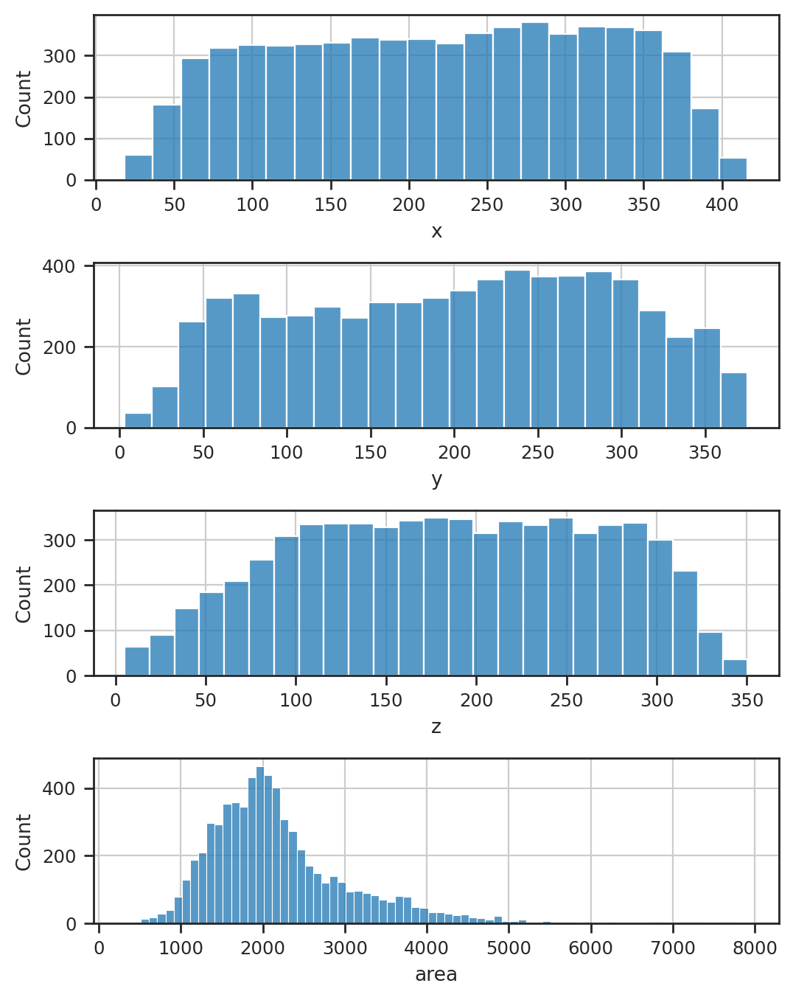

In [9]:
cols = ['x', 'y', 'z', 'area']
with sns.plotting_context('paper'):
    fig, axs = plt.subplots(4, 1, figsize=(1*6, 2*4))
    for ax, col in zip(axs, cols):
        sns.histplot(adata.obs[col], ax=ax)
        ax.set_xlabel(col)
    fig.subplots_adjust(hspace=0.5)
    plt.show()


<Axes: xlabel='area', ylabel='cov'>

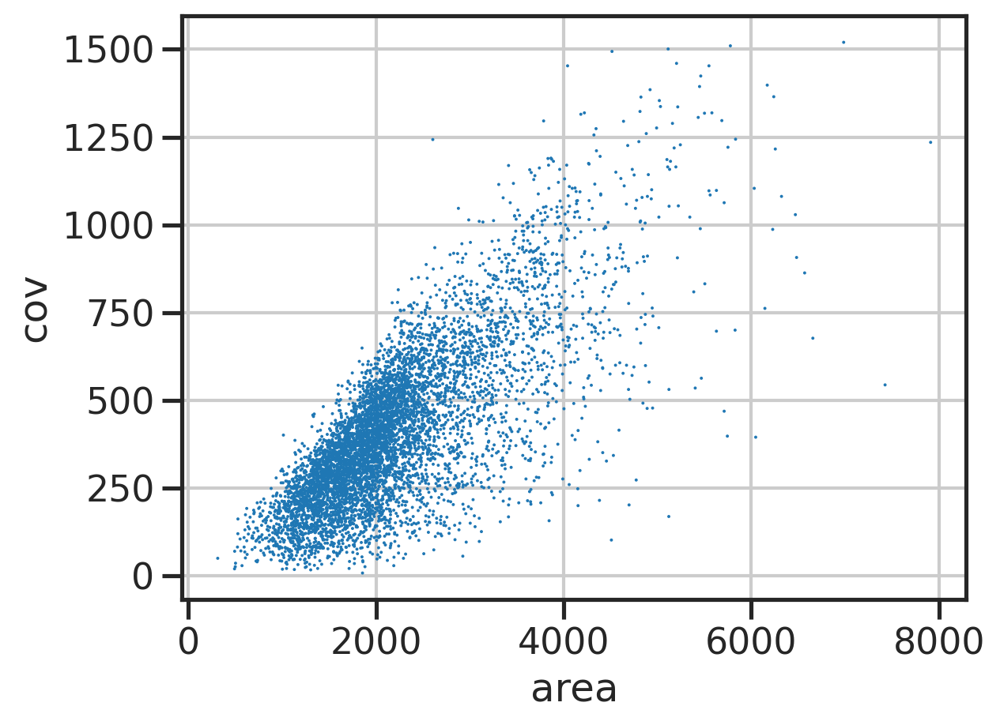

In [10]:
sns.scatterplot(data=adata.obs, x='area', y='cov', s=2, edgecolor='none')

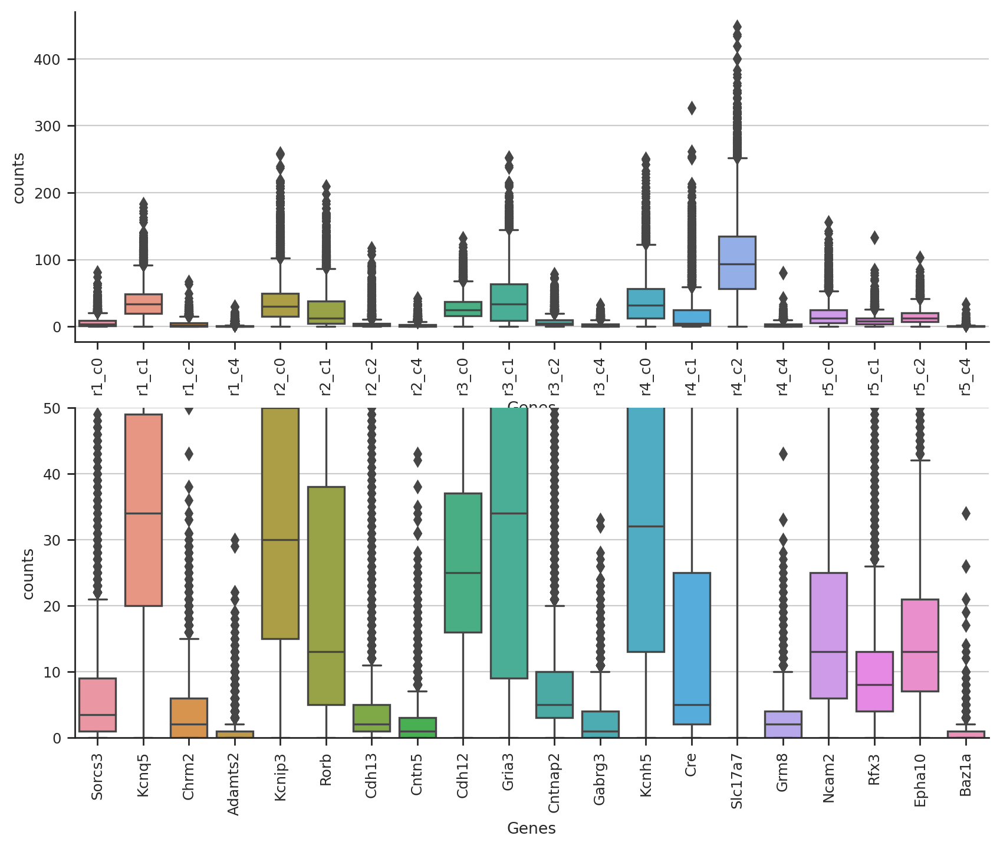

In [11]:
with sns.plotting_context('paper'):
    fig, axs = plt.subplots(2, 1, figsize=(10*1,4*2))
    ax = axs[0]
    sns.boxplot(data=adata.X, ax=ax)
    ax.set_xticklabels(adata.var.index.values, rotation=90) 
    ax.set_ylabel('counts')
    ax.set_xlabel('Genes')
    sns.despine(ax=ax)

    ax = axs[1]
    sns.boxplot(data=adata.X, ax=ax)
    ax.set_xticklabels(adata.var['gene'].values, rotation=90)
    sns.despine(ax=ax)
    ax.set_ylim([0,50])
    ax.set_ylabel('counts')
    ax.set_xlabel('Genes')

In [12]:
# adata2 - separate proj and fish cols 
proj_cols = ['r4_c1']
proj_names = ['RL_Cre']
fish_cols = [col for col in ftrs_cols if col not in proj_cols]

adata2 = adata[:,fish_cols].copy()
adata2.obs[proj_cols] = np.array(adata[:,proj_cols].X)
adata2.obs['cov_fish'] = np.array(adata2.X.sum(axis=1))
adata2

AnnData object with n_obs × n_vars = 6606 × 19
    obs: 'z', 'y', 'x', 'area', 'to_edge', 'cov', 'r4_c1', 'cov_fish'
    var: 'gene'

<Axes: xlabel='area', ylabel='cov'>

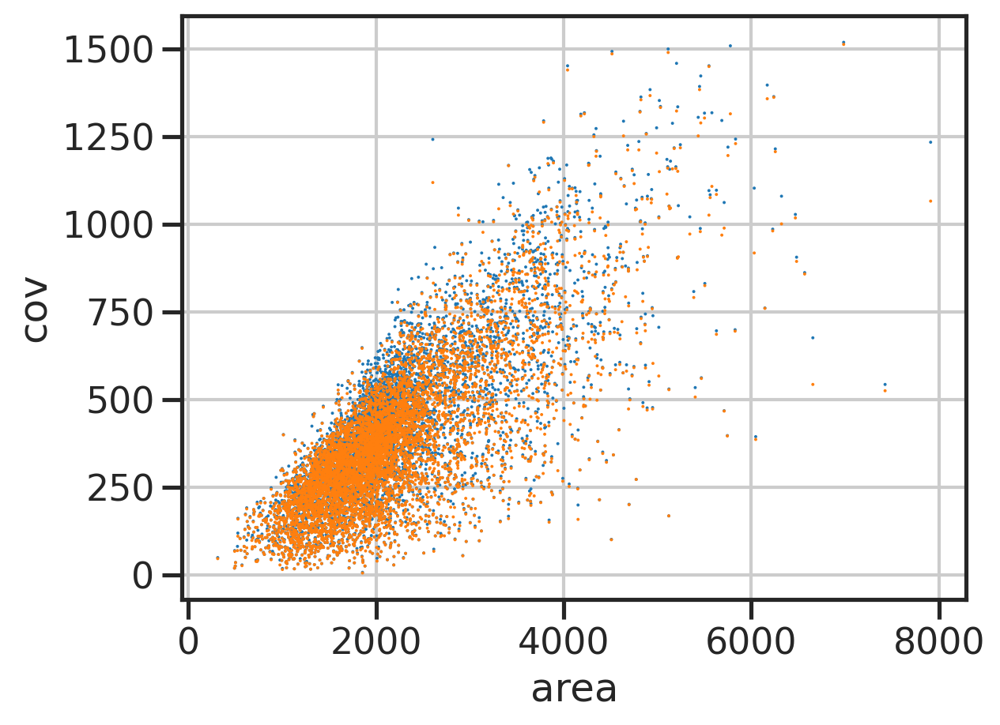

In [13]:
sns.scatterplot(data=adata2.obs, x='area', y='cov', s=2, edgecolor='none')
sns.scatterplot(data=adata2.obs, x='area', y='cov_fish', s=2, edgecolor='none')

<Axes: xlabel='area', ylabel='r4_c1'>

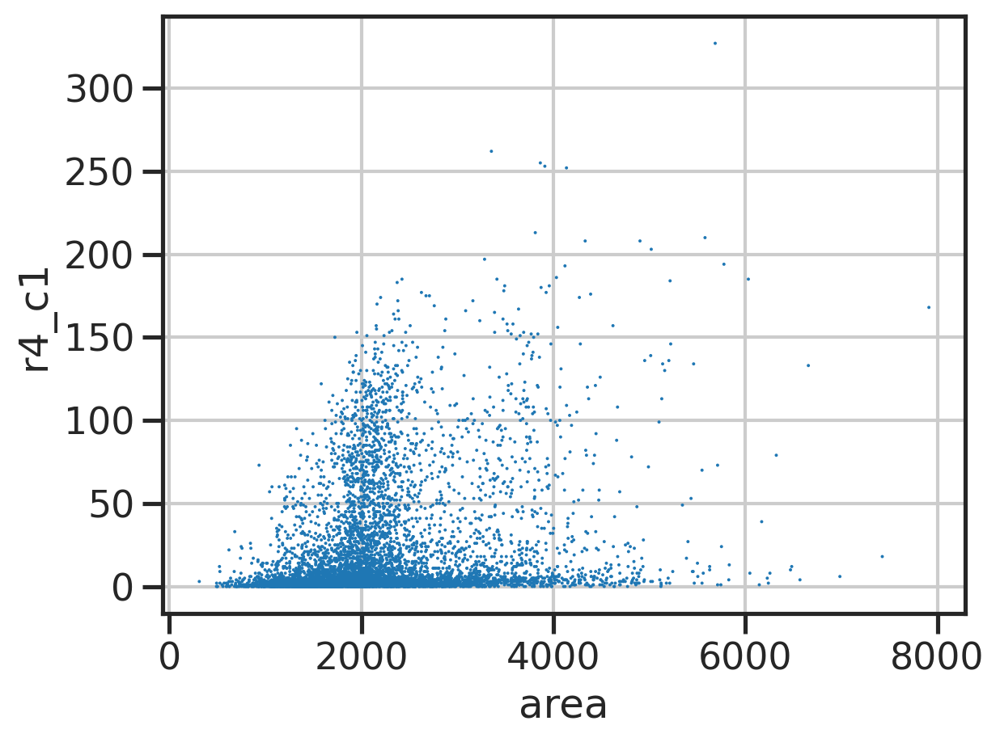

In [14]:
sns.scatterplot(data=adata2.obs, x='area', y=proj_cols[0], s=2, edgecolor='none')

In [15]:
# ########### FLIP y!
# df['y'] = max_y -df['y']

In [16]:
# remove outliers

df = adata2.obs
conds = [
    df['area'] > 500,
    df['x'] > min_x + 20,
    df['x'] < max_x - 20,
    
    df['y'] > min_y + 20,
    df['y'] < max_y - 20,
    
    df['z'] > min_z + 20,
    df['z'] < max_z - 20,
]
cond_all = np.ones(len(df)) > 0
for cond in conds:
    cond_all = np.logical_and(cond_all, cond)
    print(cond_all.sum())
print(f"Num cells before and after: {len(df)} -> {cond_all.sum()}")

adata3 = adata2[cond_all].copy()
adata3


6602
6531
6466
6419
6235
6143
6072
Num cells before and after: 6606 -> 6072


AnnData object with n_obs × n_vars = 6072 × 19
    obs: 'z', 'y', 'x', 'area', 'to_edge', 'cov', 'r4_c1', 'cov_fish'
    var: 'gene'

In [17]:
# size
med_size = adata3.obs['area'].median()
max_size = adata3.obs['area'].max()
min_size = adata3.obs['area'].min()

print(f"Med cell size {med_size:.1f} um^3\t  {np.power(med_size,1/3):.1f} um")
print(f"Max cell size {max_size:.1f} um^3\t  {np.power(max_size,1/3):.1f} um")
print(f"Min cell size {min_size:.1f} um^3\t  {np.power(min_size,1/3):.1f} um")

size_factor = (adata3.obs['area']/med_size).values


# norm by size; by log2+1; by zscore
mat_raw = np.array(adata3.X)
mat_nrm = mat_raw/size_factor.reshape(-1,1) # .divide(size_factor, axis=0)
mat_log = np.log2(1+mat_nrm)
mat_zsc = (mat_log - np.mean(mat_log, axis=0))/np.std(mat_log, axis=0)

adata3.layers['nrm'] = mat_nrm
adata3.layers['log'] = mat_log
adata3.layers['zsc'] = mat_zsc
adata3

Med cell size 2017.7 um^3	  12.6 um
Max cell size 7912.5 um^3	  19.9 um
Min cell size 501.9 um^3	  7.9 um


AnnData object with n_obs × n_vars = 6072 × 19
    obs: 'z', 'y', 'x', 'area', 'to_edge', 'cov', 'r4_c1', 'cov_fish'
    var: 'gene'
    layers: 'nrm', 'log', 'zsc'

In [18]:
mat_ftrs = pd.DataFrame(adata3.layers['zsc'], index=adata3.obs.index, columns=adata3.var.index)
mat_ftrs


,r1_c0,r1_c1,r1_c2,r1_c4,r2_c0,r2_c1,r2_c2,r2_c4,r3_c0,r3_c1,r3_c2,r3_c4,r4_c0,r4_c2,r4_c4,r5_c0,r5_c1,r5_c2,r5_c4
roi,,,,,,,,,,,,,,,,,,,
1,0.251131,-0.061960,-1.237140,1.931977,0.036596,-0.959451,-0.157074,0.395697,-0.792369,0.759279,-0.725626,0.811138,0.010865,0.327313,1.096871,-1.427340,0.664358,-1.256188,1.291591
2,1.293618,1.187677,-0.595855,-0.649469,-0.809223,0.580702,-1.269787,-1.105321,0.692261,0.712208,0.840517,0.505591,0.766408,0.653898,-0.485023,0.338176,0.575938,1.435210,1.799302
3,-1.100669,0.748530,-0.557359,-0.051432,0.833077,0.046952,-0.127409,1.130993,0.404196,0.529274,0.971784,0.852598,0.191113,0.963762,1.048241,1.861178,0.244418,-0.356778,0.997407
4,0.984016,0.082745,-0.635561,0.838094,0.571480,-0.664044,-0.240003,-1.105321,-0.671190,0.967350,0.218219,0.693884,0.228272,0.661133,1.532382,-1.374097,1.343420,0.665913,-0.534710
5,0.697707,-0.903985,-0.837578,2.095742,0.346334,-1.103678,0.872543,-0.286543,-0.997956,0.715179,-0.570773,1.194308,-0.398978,0.489341,0.446424,-0.415563,1.100403,-0.405988,1.015474
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6602,1.729099,-0.248914,-1.237140,-0.649469,0.064396,-2.209585,-0.058665,2.270599,-2.931973,-0.244443,0.946351,0.303583,-0.790442,-1.600963,3.087553,1.363159,-0.253182,-0.223123,-0.534710
6603,-0.162199,-1.677231,-1.237140,-0.649469,-0.962563,-0.657273,0.180161,-1.105321,-1.819477,-0.483462,0.520681,1.269852,-2.077736,-1.533144,-1.279715,-1.481425,-0.379084,-3.948985,-0.534710
6604,0.231335,-0.715955,1.329064,0.818246,0.444746,0.797000,-0.253744,-1.105321,0.132028,-0.826369,-0.490920,-1.086598,0.551861,-0.104945,-1.279715,0.511072,-0.618282,-1.781923,-0.534710


In [19]:
mat_prjs = adata3.obs[proj_cols] # dfnew[['r4_c1_log2']].rename(columns={'r4_c1_log2': 'Cre (RL)'})
mat_prjs

,r4_c1
roi,
1,28.0
2,18.0
3,6.0
4,126.0
5,23.0
...,...
6602,1.0
6603,1.0
6604,1.0


In [20]:
# # PCAs
# n_pc = len(genes_order)
# idx_pcs = np.arange(1, n_pc+1)

# pca = PCA(n_components=n_pc)
# pcs = pca.fit_transform(mat_zscore) 
# plt.plot(idx_pcs, pca.explained_variance_ratio_, 'o')
# plt.xticks(idx_pcs)
# plt.ylim(ymin=0)
# plt.axhline(1/n_pc, color='k')
# plt.xlabel('PC')
# plt.ylabel('Explained variance')

# for i in idx_pcs:
#     dfnew[f'PC{i}'] = pcs[:,i-1]

In [21]:
# # UMAPs
# Zspace = umap.UMAP(n_components=2).fit_transform(pcs)
# dfnew['umap_x'] = Zspace[:,0]
# dfnew['umap_y'] = Zspace[:,1]

# # UMAPs more
# nns = [30, 60, 120, 240, 480]
# for nn in nns:
#     Zspace = umap.UMAP(n_components=2, n_neighbors=nn).fit_transform(pcs)
#     dfnew[f'umap_x_nn{nn}'] = Zspace[:,0]
#     dfnew[f'umap_y_nn{nn}'] = Zspace[:,1]

# # clsts
# numclsts = [2, 5, 10]
# for k in numclsts: 
#     model = KMeans(n_clusters=k)
#     clsts = model.fit_predict(pcs)
#     dfnew[f'clsts_k{k}'] = np.char.add("c", clsts.astype(str))

# # clsts
# G = miscu.build_feature_graph_knnlite(pcs, k=15, metric='euclidean')
# rs = [0.01, 0.02, 0.05, 0.1, 1]
# for r in rs:
#     clsts = miscu.leiden(G, dfnew.index.values, resolution=r) 
#     dfnew[f'clsts_r{r}'] = np.char.add("c", np.array(clsts).astype(str))

# check basics
- y: pia-ventricular axis

In [22]:
dfnew = adata3.obs.copy()

raw_ftrs_cols = np.char.add(fish_cols, '_raw')
nrm_ftrs_cols = np.char.add(fish_cols, '_nrm')
log_ftrs_cols = np.char.add(fish_cols, '_log')
zsc_ftrs_cols = np.char.add(fish_cols, '_zsc')

dfnew[nrm_ftrs_cols] = np.array(adata3.layers['nrm'])

In [23]:
# binary analysis
ybins = np.linspace(0,400,100)
dfnew['ybin'] = pd.cut(dfnew['y'], bins=ybins)

xbins = np.linspace(0,400,100)
dfnew['xbin'] = pd.cut(dfnew['x'], bins=xbins)

zbins = np.linspace(0,400,100)
dfnew['zbin'] = pd.cut(dfnew['z'], bins=zbins)

bins_zb = np.linspace(0,400,9).astype(int)
print(bins_zb)
dfnew['bins_zb'] = pd.cut(dfnew['z'], bins=bins_zb)

bins_zb_4p = np.linspace(0,400,5).astype(int)
print(bins_zb_4p)
dfnew['bins_zb_4p'] = pd.cut(dfnew['z'], bins=bins_zb_4p)

bins_xb = np.linspace(0,400,9).astype(int)
print(bins_zb)
dfnew['bins_xb'] = pd.cut(dfnew['x'], bins=bins_xb)

[  0  50 100 150 200 250 300 350 400]
[  0 100 200 300 400]
[  0  50 100 150 200 250 300 350 400]


# z-sectioning visuals
- bin into zbin
- plot for each zbin

In [24]:
def gen_palette(dfnew, col):
    # set global colorbar
    hue_order = np.unique(dfnew[col]) 
    ncat = len(hue_order)
    if ncat > 5:
        cmap = 'Paired'
    else:
        cmap = 'tab10'
    palette = {clst: clr for clst, clr in zip(hue_order, sns.color_palette(cmap, ncat))}
    return palette

In [25]:
def view_z_sections(dfnew, sp_x, sp_y, col=None, cmap='coolwarm', title=None, vmaxp=95, vminp=0):
    """
    """
    # assert len(dfnew['bins_zb'].unique())-1 == 8 # 8 intervals
    
    # set global colorbar
    if col is not None:
        vmax = np.percentile(dfnew[col].values, vmaxp)
        vmin = -vmax*0.1
        # vmin = np.percentile(dfnew[col].values, vminp)
        
    fig, axs = plt.subplots(2, 4, figsize=(4*4,2*4), sharex=True, sharey=True)
    for i, (thisbin, dfsub) in enumerate(dfnew.groupby('bins_zb')):
        ax = axs.flat[i]
        ax.grid(False)

        x = dfsub[sp_x].values
        y = dfsub[sp_y].values
        if col is not None:
            c = dfsub[col].values
            g = ax.scatter(x, y, c=c, s=10, cmap=cmap, vmax=vmax, vmin=vmin,
                           edgecolor='none', 
                          )
        else:
            g = ax.scatter(x, y, s=10, c='gray', 
                           edgecolor='none', 
                          )
            
        sns.despine(ax=ax)
        ax.set_aspect('equal')
        ax.set_title(f" z: {thisbin}", loc='left', y=0.95)#va='top')#va='top', y=0.96)

        if i%4 == 0:
            ax.set_ylabel(sp_y)
        if i >= 4:
            ax.set_xlabel(sp_x)

    if col is not None:
        cax = fig.add_axes([0.93, 0.3, 0.01, 0.3])
        fig.colorbar(g, cax=cax, label='', shrink=0.3, aspect=10, ticks=[0,vmax], orientation='vertical')
    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    if title is not None:
        fig.suptitle(title, fontsize=20, y=0.92)
    plt.show()

In [26]:
def view_z_sections_4panels(dfnew, sp_x, sp_y, col=None, cmap='coolwarm', title=None, vmaxp=95, vminp=0):
    """
    """
    # assert len(dfnew['bins_zb_4p'].unique())-1 == 4 # 4 intervals
    
    # set global colorbar
    if col is not None:
        vmax = np.percentile(dfnew[col].values, vmaxp)
        vmin = -vmax*0.1
        # vmin = np.percentile(dfnew[col].values, vminp)
        
    fig, axs = plt.subplots(1, 4, figsize=(4*4,1*4), sharex=True, sharey=True)
    for i, (thisbin, dfsub) in enumerate(dfnew.groupby('bins_zb_4p')):
        ax = axs.flat[i]
        ax.grid(False)

        x = dfsub[sp_x].values
        y = dfsub[sp_y].values
        if col is not None:
            c = dfsub[col].values
            g = ax.scatter(x, y, c=c, s=8, cmap=cmap, vmax=vmax, vmin=vmin,
                           edgecolor='none', 
                          )
        else:
            g = ax.scatter(x, y, s=8, c='gray', 
                           edgecolor='none', 
                          )
            
        sns.despine(ax=ax)
        ax.set_aspect('equal')
        ax.set_title(f" z: {thisbin}", loc='left', y=0.95)#va='top')#va='top', y=0.96)

        if i == 0:
            ax.set_ylabel(sp_y)
        ax.set_xlabel(sp_x)

    if col is not None:
        cax = fig.add_axes([0.93, 0.3, 0.01, 0.3])
        fig.colorbar(g, cax=cax, label='', shrink=0.3, aspect=10, ticks=[0,vmax], orientation='vertical')
    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    if title is not None:
        fig.suptitle(title, fontsize=20, y=0.92)
    plt.show()

In [27]:
def view_z_sections_labels(dfnew, sp_x, sp_y, col, palette=None, title=None):
    """
    """
    # assert len(dfnew['bins_zb'].unique())-1 == 8 # 8 intervals
    
    # set global colorbar
    hue_order = np.unique(dfnew[col]) 
    ncat = len(hue_order)
    if ncat > 5:
        cmap = 'Paired'
    else:
        cmap = 'tab10'
    if palette is None:
        palette = {clst: clr for clst, clr in zip(hue_order, sns.color_palette(cmap, ncat))}
        
    fig, axs = plt.subplots(2, 4, figsize=(4*4,2*4), sharex=True, sharey=True)
    for i, (thisbin, dfsub) in enumerate(dfnew.groupby('bins_zb')):
        ax = axs.flat[i]
        ax.grid(False)
        if i == 4-1:
            legend = True
        else:
            legend = False
        g = sns.scatterplot(data=dfsub, x=sp_x, y=sp_y, hue=col, 
                            hue_order=hue_order, palette=palette,
                            s=10, 
                            edgecolor='none', 
                            ax=ax,
                            legend=legend,
                          )
        sns.despine(ax=ax)
        ax.set_aspect('equal')
        ax.set_title(f" z: {thisbin}", loc='left', y=0.95)#va='top')#va='top', y=0.96)

        if i%4 == 0:
            ax.set_ylabel(sp_y)
        if i >= 4:
            ax.set_xlabel(sp_x)
        if i == 4-1:
            ax.legend(bbox_to_anchor=(1,1))

    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    if title is not None:
        fig.suptitle(title, fontsize=20, y=0.92)
    plt.show()

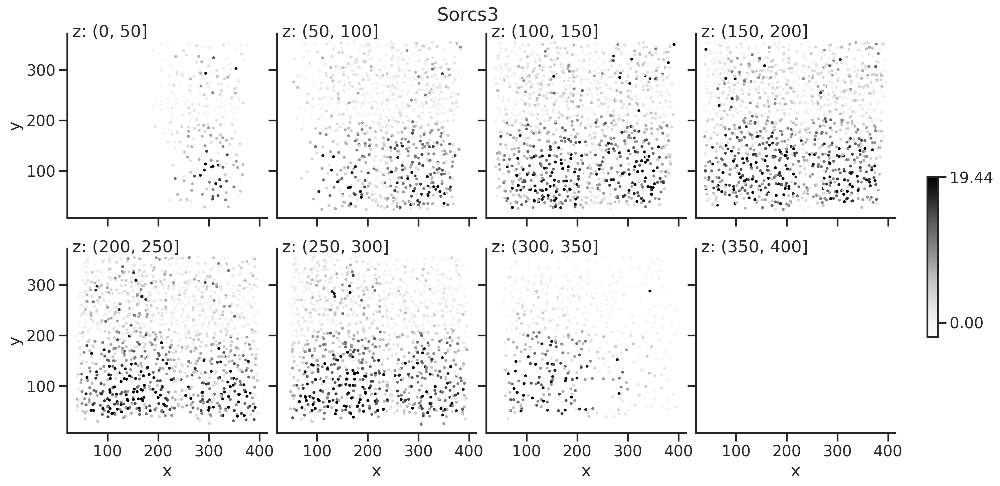

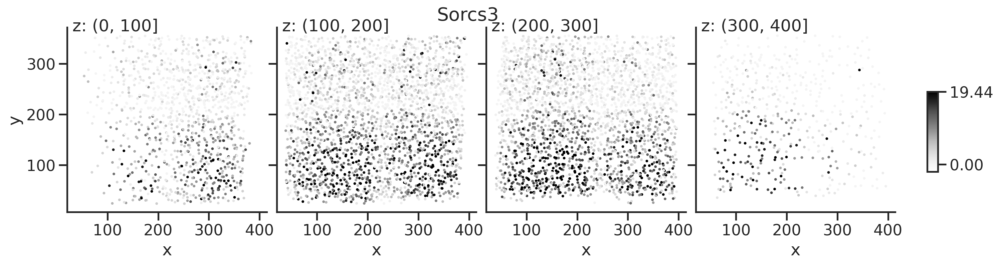

In [28]:
sp_x, sp_y = 'x', 'y'
col = fish_cols[0] # ftrs_order[0]
title = gene_names[col]

view_z_sections(dfnew, sp_x, sp_y, col=col+'_nrm', cmap='Greys', title=title)
view_z_sections_4panels(dfnew, sp_x, sp_y, col=col+'_nrm', cmap='Greys', title=title)

# hierarchical clustering

In [29]:
def gen_discrete_colors(N):
    """
    """
    fig, ax = plt.subplots(figsize=(6, 1))
    fig.subplots_adjust(bottom=0.5)
    cmap = matplotlib.cm.jet
    norm = matplotlib.colors.BoundaryNorm(1+np.arange(N), cmap.N, extend='max')
    dismap = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
    fig.colorbar(dismap,
                 cax=ax, orientation='horizontal')
    plt.show()
    
    palette = {i: dismap.to_rgba(i)[:3] for i in 1+np.arange(N)}
    plt.figure(figsize=(5,1))
    plt.scatter(1+np.arange(N), [0]*N, c=[palette[p] for p in palette.keys()])
    plt.show()
    return palette, dismap

(6072,) (5,)
(6072,) (12,)
(6072,) (25,)


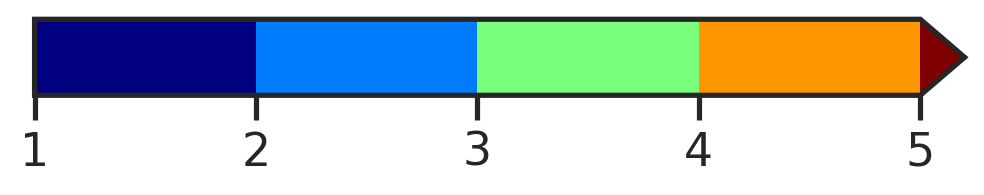

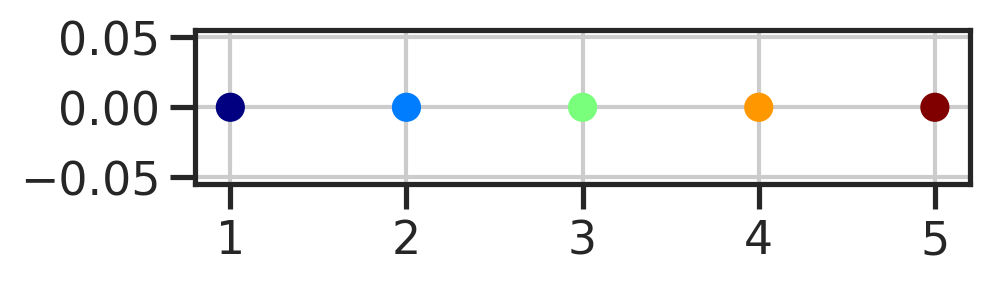

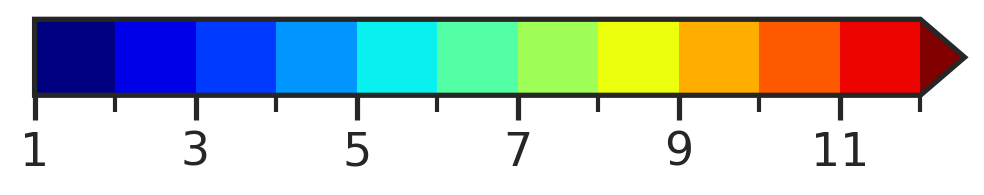

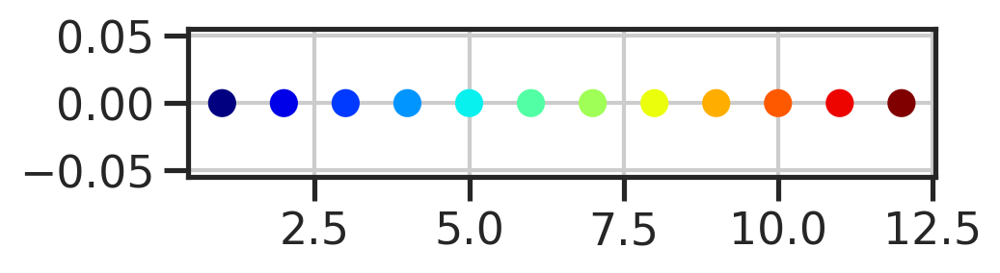

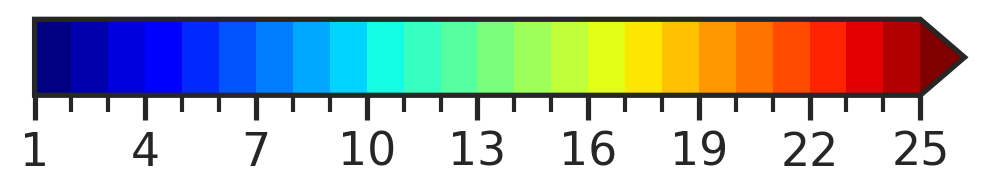

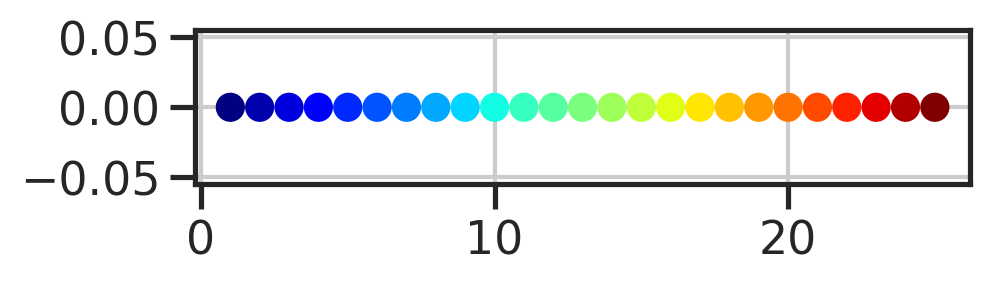

In [30]:
# sch
col_link = sch.linkage(mat_ftrs.T, method='ward', metric='euclidean')
col_order = sch.dendrogram(col_link, no_plot=True)['leaves']

row_link = sch.linkage(mat_ftrs, method='ward', metric='euclidean')
row_order = sch.dendrogram(row_link, p=30, truncate_mode='none', no_plot=True)['leaves']

# get clusters
clsts1 = sch.fcluster(row_link, 100, criterion='distance')
clsts2 = sch.fcluster(row_link,  50, criterion='distance')
clsts3 = sch.fcluster(row_link,  30, criterion='distance')

print(clsts1.shape, np.unique(clsts1).shape)
print(clsts2.shape, np.unique(clsts2).shape)
print(clsts3.shape, np.unique(clsts3).shape)

dfnew['clst_l1'] = clsts1
dfnew['clst_l2'] = clsts2
dfnew['clst_l3'] = clsts3

# colors
palette1, dismap1 = gen_discrete_colors(len(np.unique(clsts1)))
palette2, dismap2 = gen_discrete_colors(len(np.unique(clsts2)))
palette3, dismap3 = gen_discrete_colors(len(np.unique(clsts3)))

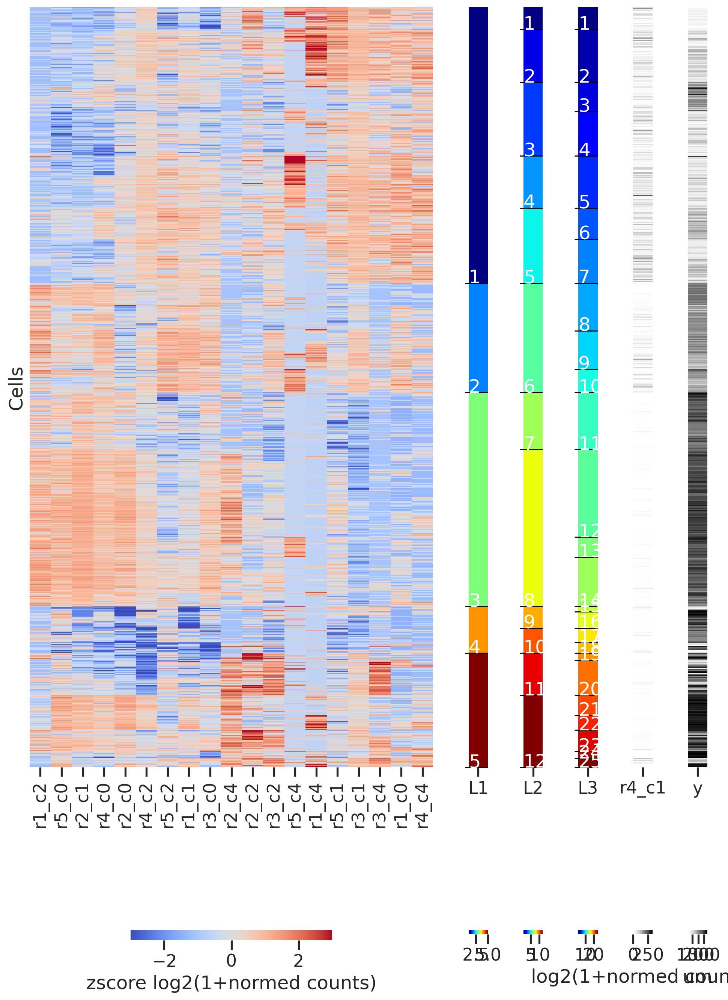

In [31]:
fig = plt.figure(figsize=(10,15))
axd = fig.subplot_mosaic("A"*8+"BCDEF")
ax = axd["A"]
sns.heatmap(
    mat_ftrs.iloc[row_order,col_order],
    yticklabels=False,
    cmap='coolwarm',
    cbar_kws=dict(shrink=0.5, location='bottom', label='zscore log2(1+normed counts)'),
    vmax=3, vmin=-3,
    ax=ax,
)
ax.set_ylabel('Cells')

for i, (ax, col) in enumerate(zip(
    (axd["B"], axd["C"], axd["D"]),
    ('clst_l1', 'clst_l2', 'clst_l3'),
    )):
    vec = dfnew[col].values
    sns.heatmap(
        dfnew[[col]].rename(columns={col: col.replace('clst_l', 'L')}).iloc[row_order],
        yticklabels=False,
        cmap='jet',
        cbar_kws=dict(location='bottom', aspect=5, label=''),
        ax=ax,
    )
    ax.set_ylabel('')
    positions = np.cumsum(np.unique(vec, return_counts=True)[1])
    ax.hlines(positions, xmin=-0.2, xmax=1, linewidth=1, linestyle='-', color='k', clip_on=False)
    for i, pos in enumerate(positions):
        ax.text(0, pos, i+1, color='white')

ax = axd["E"]
sns.heatmap(
    mat_prjs.iloc[row_order],
    yticklabels=False,
    cmap='Greys',
    cbar_kws=dict(location='bottom', aspect=5, label='log2(1+normed counts)'),
    ax=ax,
)
ax.set_ylabel('')

ax = axd["F"]
sns.heatmap(
    dfnew[['y']].iloc[row_order], 
    yticklabels=False,
    cmap='Greys',
    cbar_kws=dict(location='bottom', aspect=5, label='um'),
    # vmin=0,
    ax=ax,
)
ax.set_ylabel('')
fig.tight_layout()

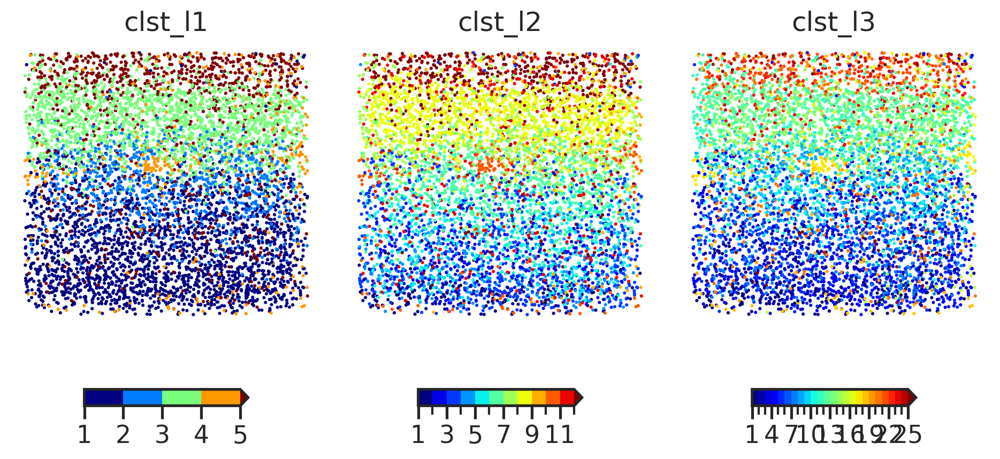

In [32]:
sp_x, sp_y = 'x', 'y'
fig, axs = plt.subplots(1,3,figsize=(4*3,5*1), sharey=True, sharex=True)
# cbar_ax = fig.add_axes([0.92, 0.5, 0.01, 0.2])
for i, (col, palette, dismap, ax) in enumerate(zip(['clst_l1', 'clst_l2', 'clst_l3'], 
                                                   [ palette1,  palette2,  palette3],
                                                   [ dismap1,   dismap2,   dismap3],
                                                   axs.flat)):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    
    ax.grid(False)
    g = ax.scatter(x, y, c=pd.Series(palette)[c], s=5, edgecolor='none',)
    sns.despine(ax=ax)
    ax.set_title(col)
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.axis('off')
    fig.colorbar(dismap, ax=ax, orientation='horizontal', shrink=0.5, aspect=10)
    
fig.subplots_adjust(hspace=0.1, wspace=0.02)

/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1062: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.asanyarray(x)


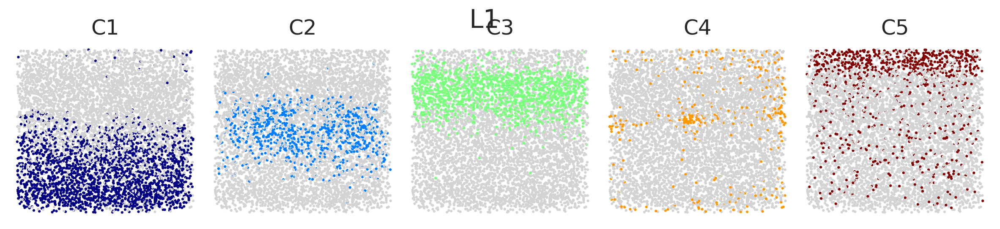

In [33]:
sp_x, sp_y = 'x', 'y'
col = 'clst_l1'
palette = palette1
dismap = dismap1
n = len(dfnew[col].unique())
nx = min(6,n)
ny = int((n+nx-1)/nx)
suptitle = 'L1'

fig, axs = plt.subplots(ny,nx,figsize=(3*nx,3*ny), sharey=True, sharex=True)
for i, ax in enumerate(axs.flat):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    
    ax.grid(False)
    g = ax.scatter(x, y, c=[palette[_c] if i+1==_c else 'lightgray' for _c in c], s=5, edgecolor='none',)
    
    sns.despine(ax=ax)
    ax.set_title(f"C{i+1}")
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.axis('off')
    
fig.suptitle(suptitle)
fig.subplots_adjust(hspace=0.1, wspace=0.02)

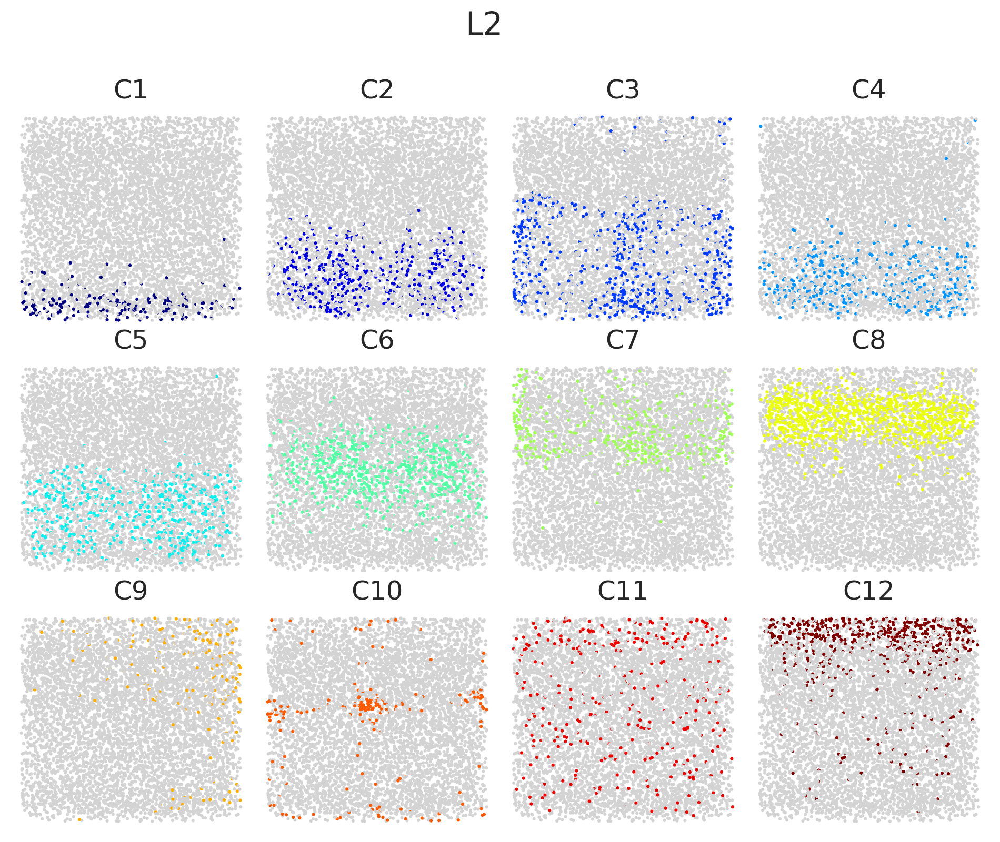

In [34]:
sp_x, sp_y = 'x', 'y'
col = 'clst_l2'
palette = palette2
dismap = dismap2
n = len(dfnew[col].unique())
nx = min(4,n)
ny = int((n+nx-1)/nx)
suptitle = 'L2'

fig, axs = plt.subplots(ny,nx,figsize=(3*nx,3*ny), sharey=True, sharex=True)
for i, ax in enumerate(axs.flat):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    
    ax.grid(False)
    g = ax.scatter(x, y, c=[palette[_c] if i+1==_c else 'lightgray' for _c in c], s=5, edgecolor='none',)
    
    sns.despine(ax=ax)
    ax.set_title(f"C{i+1}")
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.axis('off')
    
fig.suptitle(suptitle)
fig.subplots_adjust(hspace=0.1, wspace=0.02)

In [35]:
ftrs_order  #_v2.shape

array(['r1_c0', 'r1_c1', 'r1_c2', 'r1_c4', 'r2_c0', 'r2_c1', 'r2_c2',
       'r2_c4', 'r3_c0', 'r3_c1', 'r3_c2', 'r3_c4', 'r4_c0', 'r4_c1',
       'r4_c2', 'r4_c4', 'r5_c0', 'r5_c1', 'r5_c2', 'r5_c4'], dtype=object)

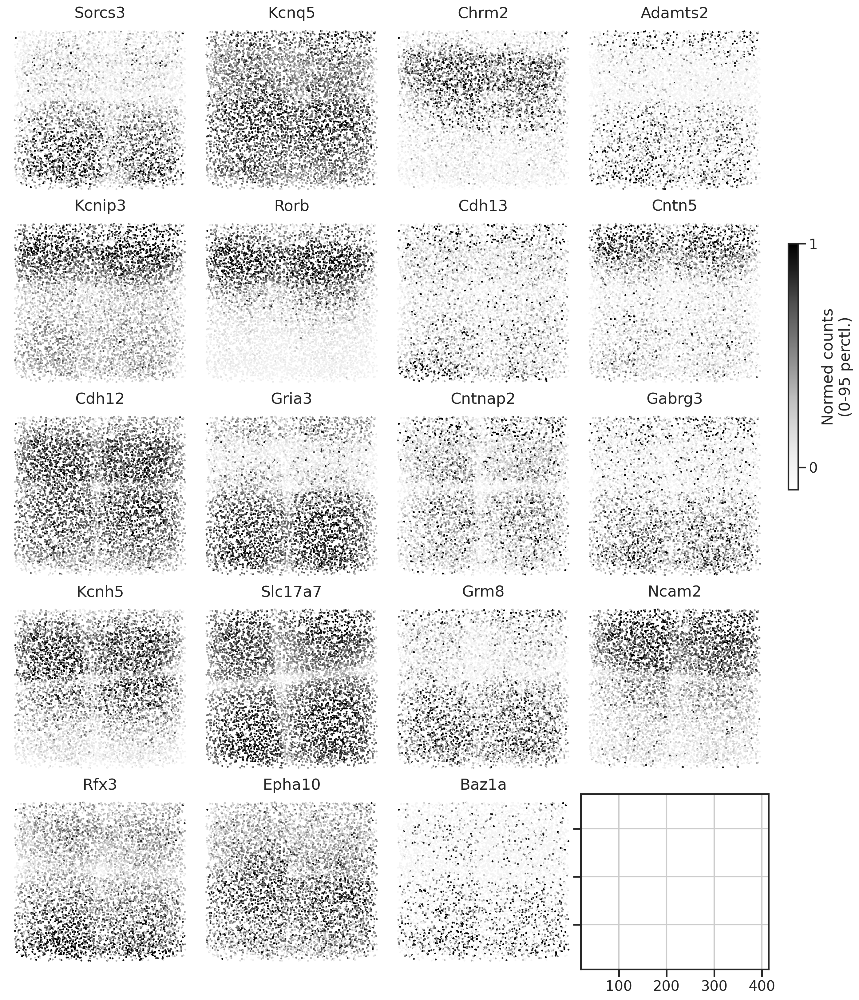

In [36]:
sp_x, sp_y = 'x', 'y'
fig, axs = plt.subplots(5,4,figsize=(4*4,4*5), sharey=True, sharex=True)
cbar_ax = fig.add_axes([0.92, 0.5, 0.01, 0.2])
for i, (col, ax) in enumerate(zip(fish_cols, axs.flat)):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col+'_nrm'].values
    vmax=np.percentile(c, 95)
    
    ax.axis('off')
    ax.grid(False)
    g = ax.scatter(x, y, c=c/vmax, s=5, edgecolor='none', cmap='Greys', vmax=1, vmin=-0.1) #vmax, vmin=-0.1*vmax)
    sns.despine(ax=ax)
    ax.set_title(gene_names[col])
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    
fig.colorbar(g, cax=cbar_ax, label='Normed counts\n(0-95 perctl.)', aspect=5, shrink=0.3, ticks=[0, 1])
fig.subplots_adjust(hspace=0.1, wspace=0.02)

<Axes: xlabel='clst_l2'>

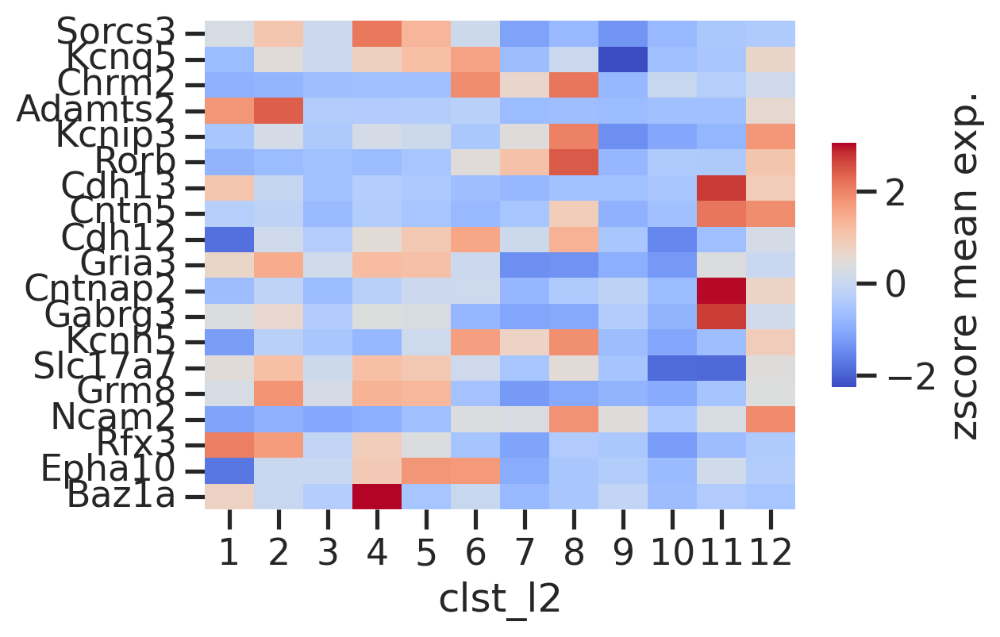

In [37]:
group = 'clst_l2'
dfmean = dfnew.groupby(group)[np.char.add(fish_cols, '_nrm')].mean()
dfmean = basicu.zscore(dfmean, axis=0)

fig, ax = plt.subplots(figsize=(6,4))
sns.heatmap(dfmean.T, ax=ax, 
            yticklabels=[gene_names[col] for col in fish_cols],
            cmap='coolwarm', cbar_kws=dict(label='zscore mean exp.', shrink=0.5, aspect=10))

# co-expression, clustering, cluster enrichment of expression

/tmp/ipykernel_18226/3569861413.py:24: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  g = sns.scatterplot(data=dfsub, x=sp_x, y=sp_y, hue=col,


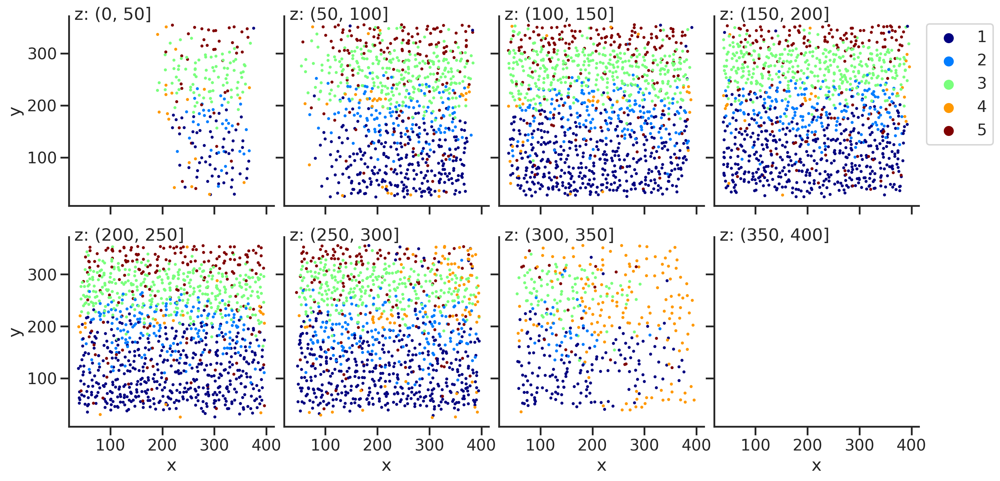

In [38]:
sp_x, sp_y = 'x', 'y'
col = 'clst_l1'
view_z_sections_labels(dfnew, sp_x, sp_y, col, palette=palette1, title=None)